<a href="https://colab.research.google.com/github/SCS-Technology-and-Innovation/DACS/blob/main/DTDA/canopy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Seeing is believing
## Image processing for enhanced decision making

As an example, we have a combined aerial image of a drone flight over a Mexican forest that is prone to bark beetle infestations. 

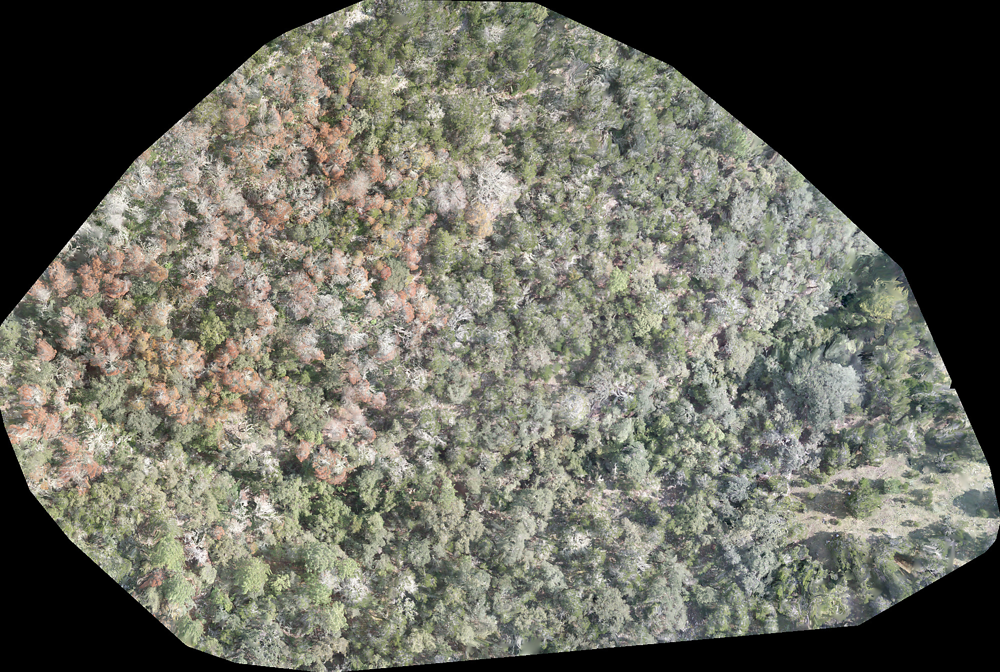

In [5]:
from PIL import Image
import requests
source = 'https://figshare.com/ndownloader/files/34146003/preview/34146003/preview.jpg'
whole = Image.open(requests.get(source, stream = True).raw)
display(whole)

It is a weirdly shaped image because it is a composite of a large amount of individual photos captured by a drone. 

Let's discard some of the image to have a rectangle that contains none of those blank corners with no actual data.

(2000, 1345)


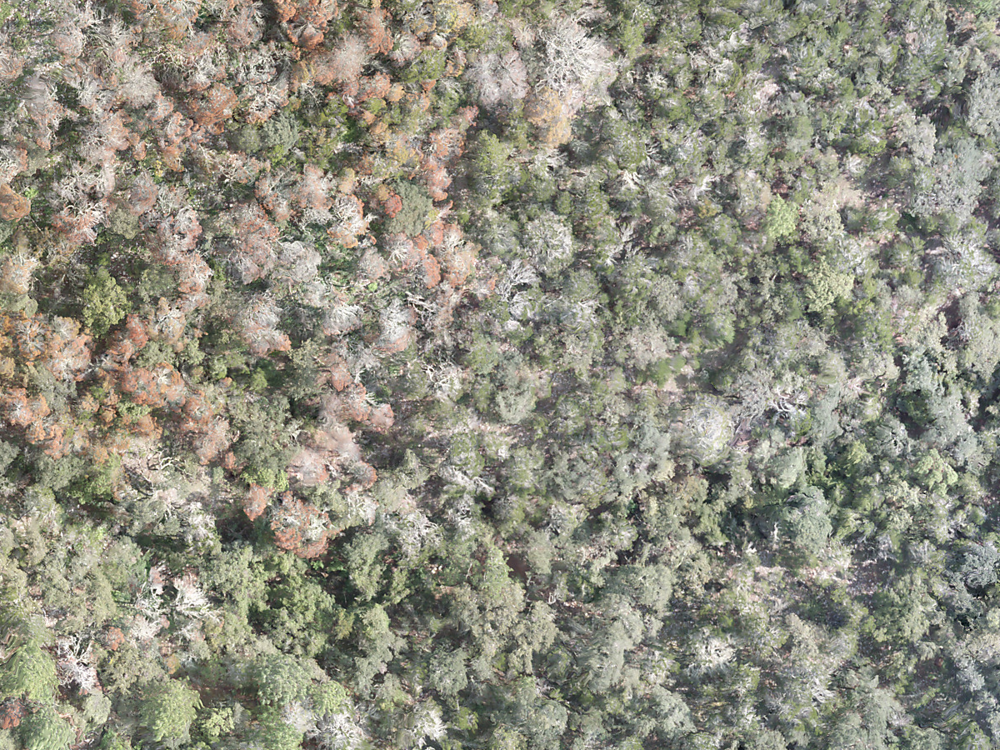

(1200, 900)


In [13]:
print(whole.size)
bb = (300, 300, 1500, 1200)
trees = whole.crop(bb)
display(trees)
print(trees.size)

The infested trees turn yellow and then red, like those on the top left corner of this rectangular image. 

We can *enhance* different aspects of the image, such as the **color saturation**.

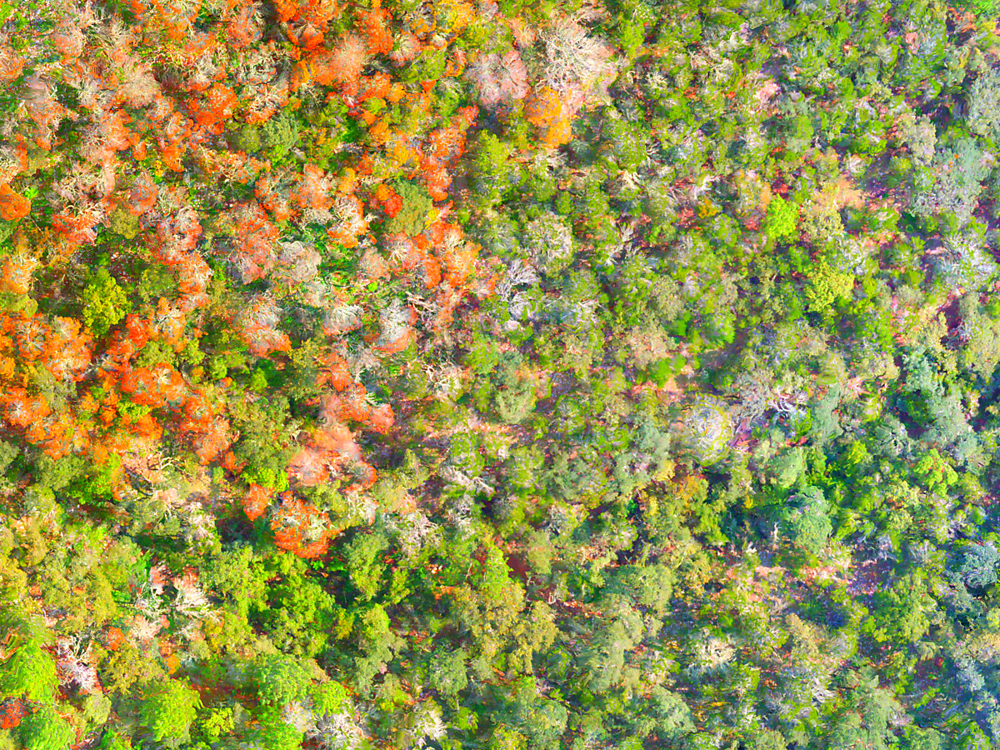

In [56]:
from PIL import ImageEnhance
saturation = ImageEnhance.Color(trees)
factor = 5
saturated = saturation.enhance(factor)
display(saturated)

In order to determine what fraction of the trees appear to be infested and where the infestion is located, geographically, we can focus on the shades of red.

Let's try a simple strategy: we look for pixels that have a strong red channel while the values of the blue and the green channels are much lower. 

We can turn any pixel that matches that criteria to full red, whereas we can make all the other pixels black.

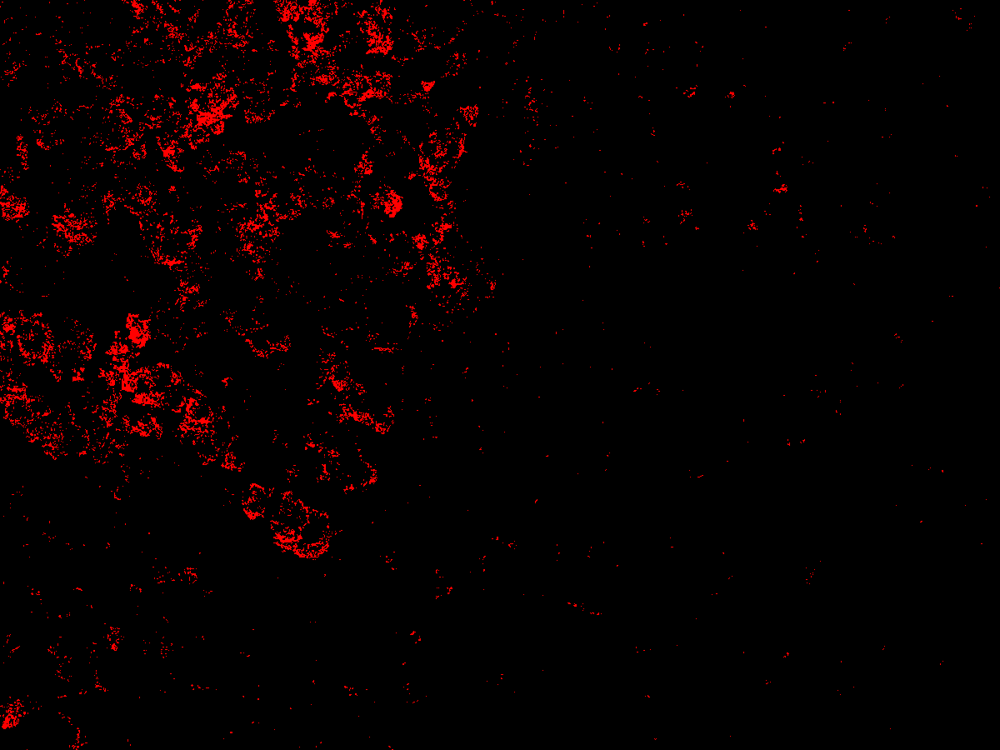

In [104]:
reds = saturated.copy()
pixels = reds.load()
w, h = reds.size
threshold = 200
for row in range(h):
  for column in range(w):
    (red, green, blue) = pixels[column, row]
    if red > threshold and red > 2 * green and red > 2 * blue:
      pixels[column, row] = (255, 0, 0) # keep only the dominant red
    else:
      pixels[column, row] = (0, 0, 0) # black if red not dominant
display(reds)

We can overlay this on the photo by merging the two images (the channels and the resolution must match).

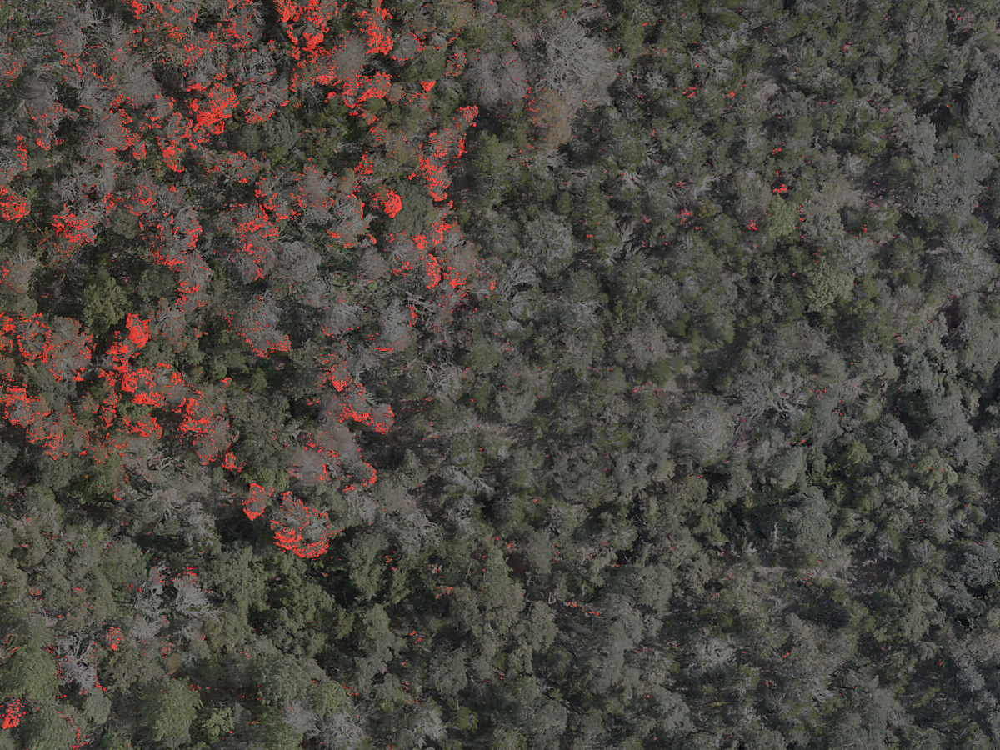

In [110]:
trees = trees.convert('RGB')
overlay = Image.blend(trees, reds, 0.5)
display(overlay)

This is nice, but rather fine grained. We do not want to identify the infestation leaf by leaf, but rather at a tree-level granularity. Also note how there is red ground between the the green trees in other zones of the image.

To alleviate these issues, we can play around with statistical *kernels* like **minimum**, **median**, and **maximum** within a neighborhood of a specified size.

The median filter assigns every pixel the value of the median value of its neighborhood in the input image.

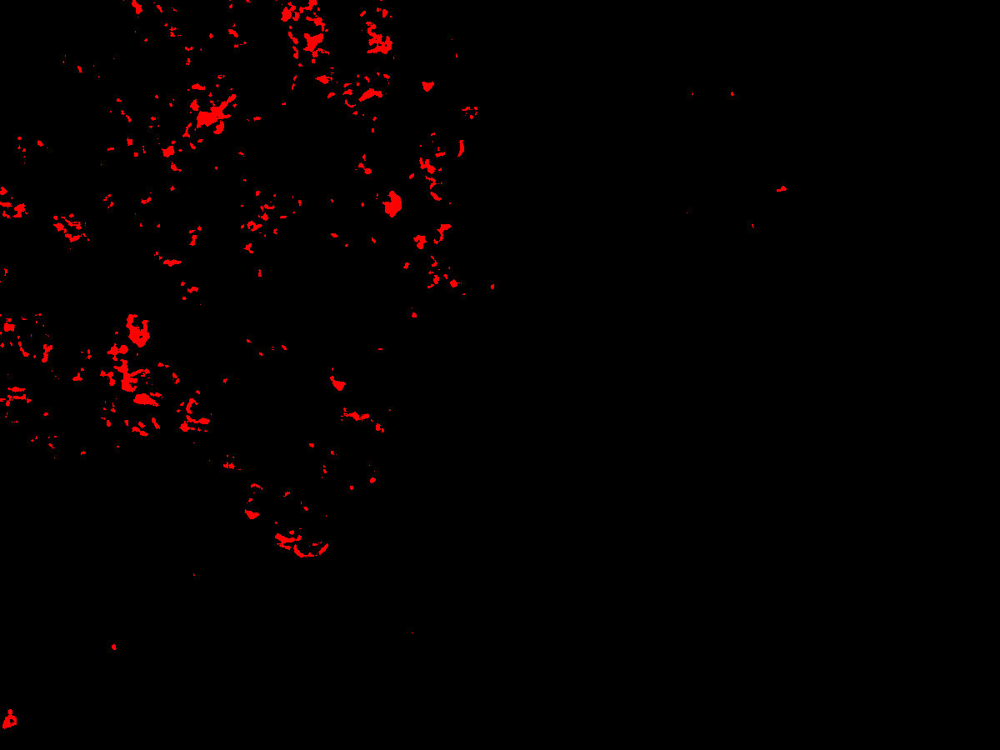

In [58]:
median = target.filter(ImageFilter.MedianFilter(size = 5))
display(median)

To get rid of single-pixel red zones, we can use the **minimum** filter to "thin" the red spots.

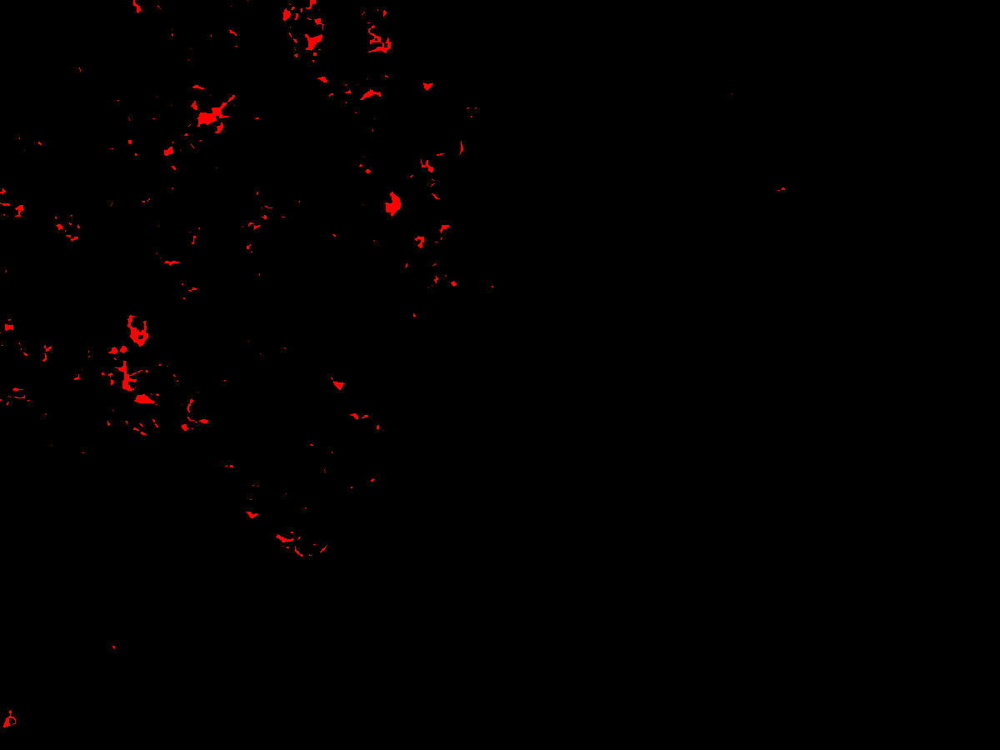

In [63]:
minimal = median.filter(ImageFilter.MinFilter(size = 3))
display(minimal)

Similarly, we can "fatten" zones by using the **maximum** filter.

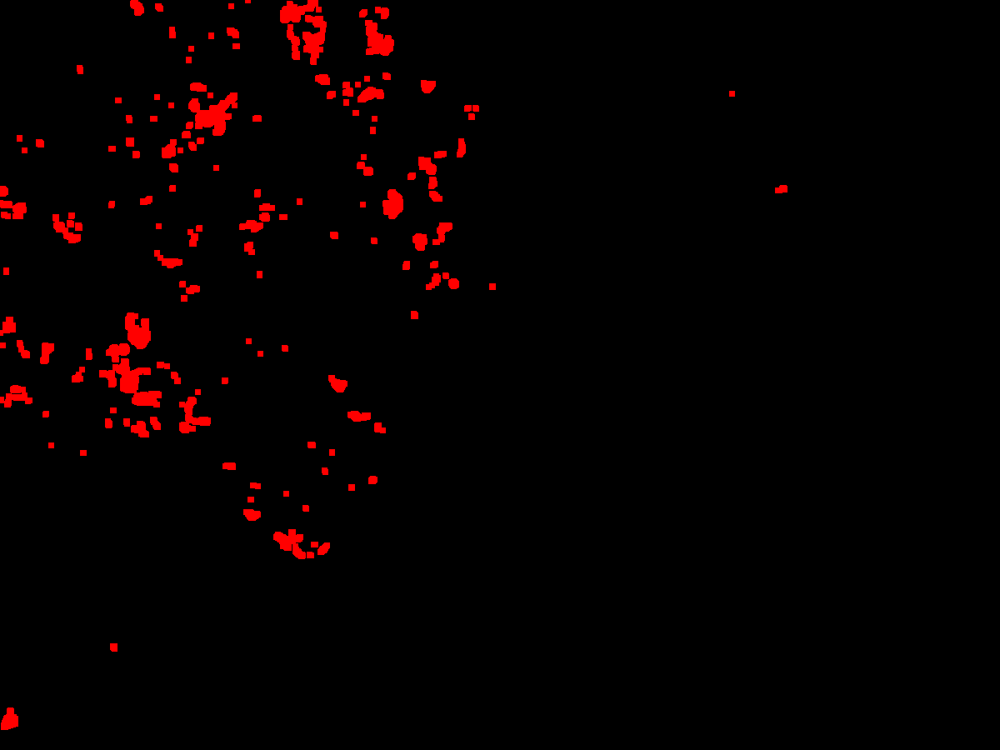

In [64]:
maximal = minimal.filter(ImageFilter.MaxFilter(size = 7))
display(maximal)

Another way to make the spots less fragmented is to **blur** the image.

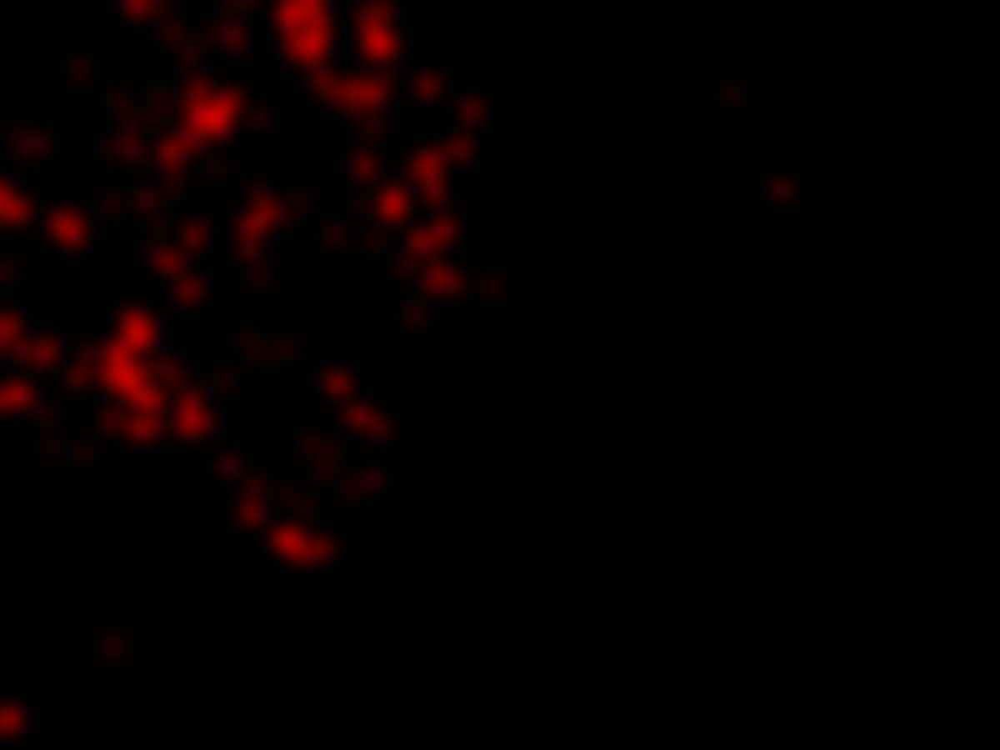

In [65]:
blurred = maximal.filter(ImageFilter.GaussianBlur(radius = 10))
display(blurred)

Blurring made the image a bit dark, but alas, there is no need to worry: we can enhance its **brightness**.

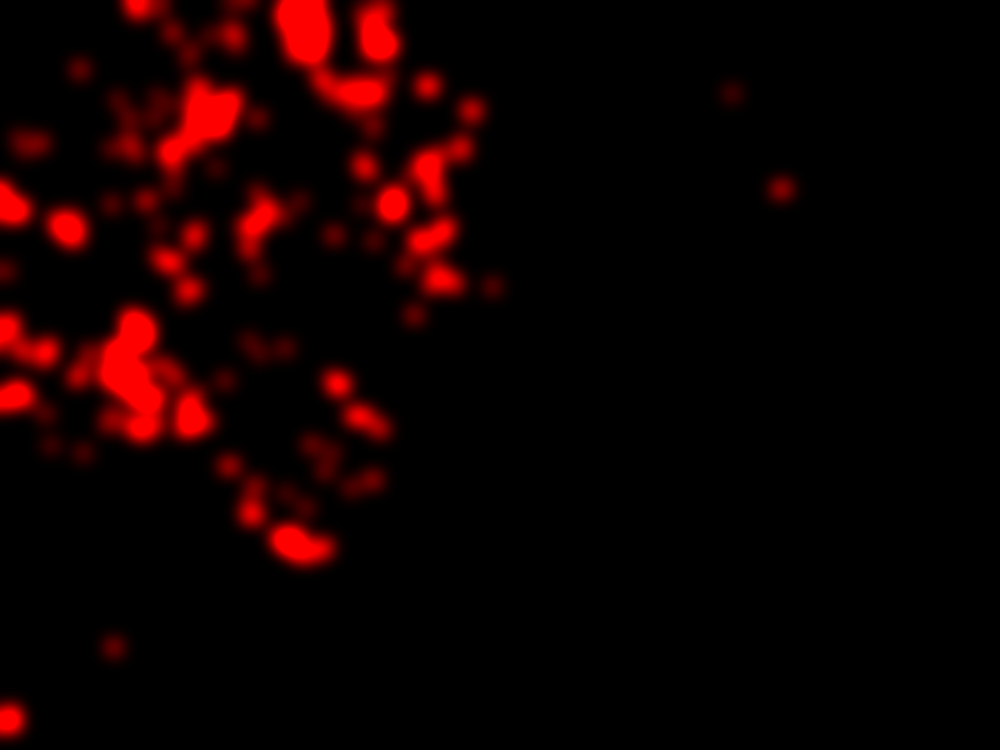

In [66]:
brightness = ImageEnhance.Brightness(blurred)
brighter = brightness.enhance(3)
display(brighter)

Another useful enhancement is adjusting the **contrast** of an image.

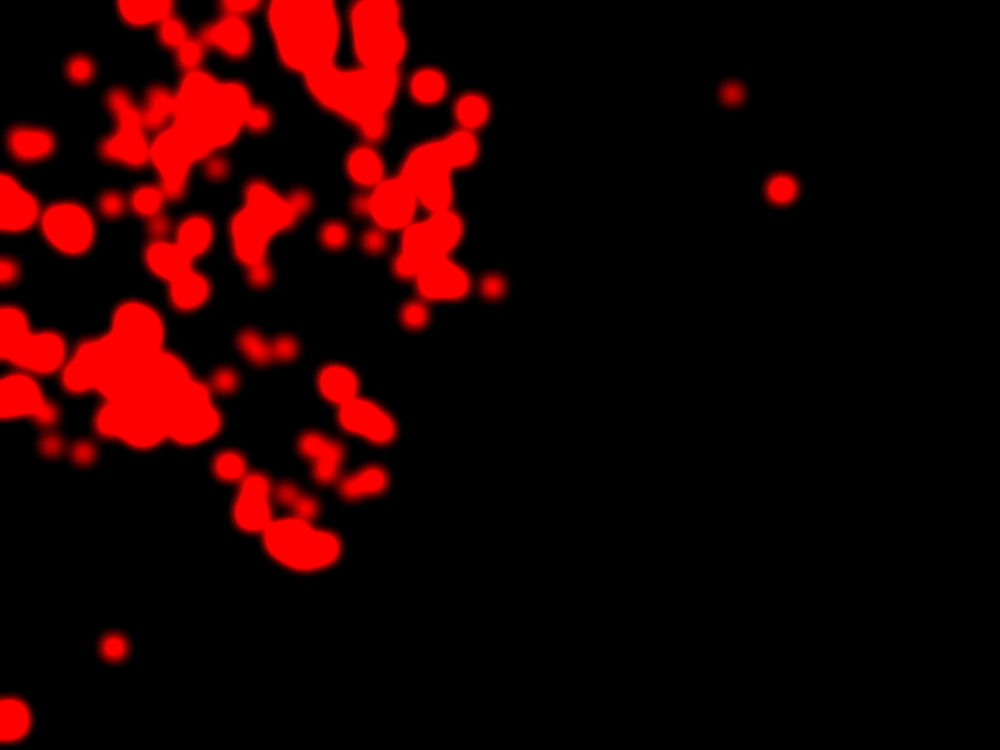

In [67]:
contrast = ImageEnhance.Contrast(brighter)
cont = contrast.enhance(4)
display(cont)

Now we have a pretty good idea of where the red-colored trees are located. We can use this information to create a single-channel (grayscale) "mask" to define a yes/no separation by placing white color to the "yes" pixels and black color to "no" pixels.

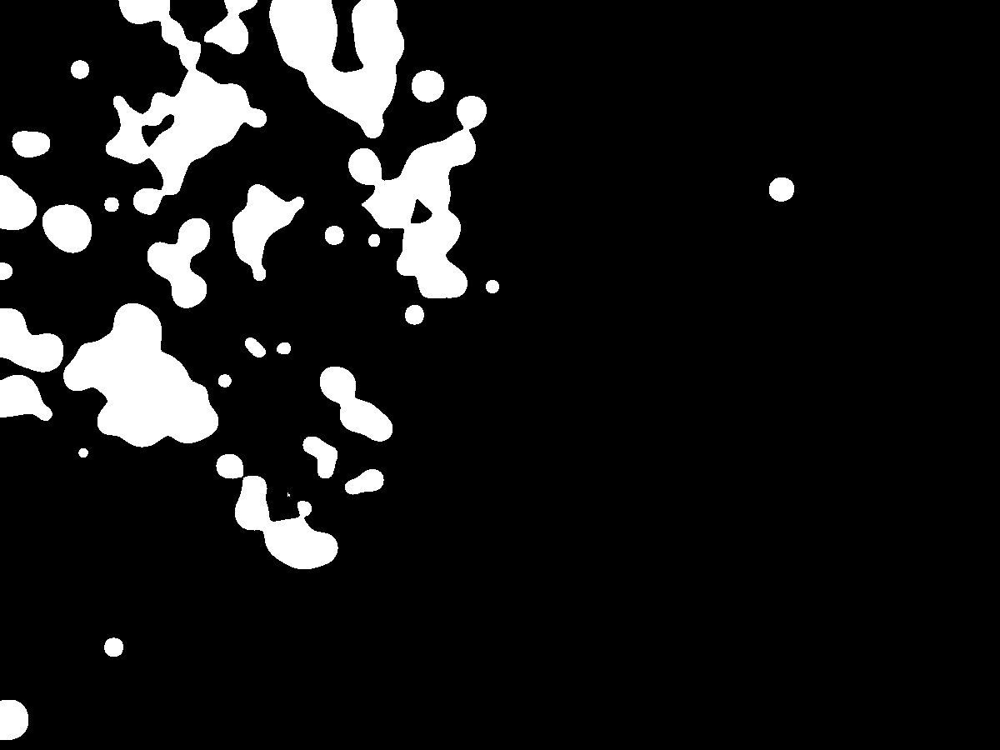

In [101]:
yesno = cont.copy()
yesno.convert('L')
pixels = yesno.load()
w, h = cont.size
threshold = 200
for row in range(h):
  for column in range(w):
    (red, green, blue) = pixels[column, row]
    if red > threshold:
      pixels[column, row] = 255 # white
    else:
      pixels[column, row] = 0 # black
display(mask)

If we add up the pixel values of this mask and normalize by how many there are (taking into account that white means 255), we can extract the percentage of infected-appearing trees.

In [96]:
import numpy as np
bits = np.asarray(mask, dtype = 'int32')
total = w * h
whites = bits.sum()
maximum = 255 * total
proportion = whites / maximum
perc = 100 * proportion
print(f'{perc:.2f}%')

10.30%


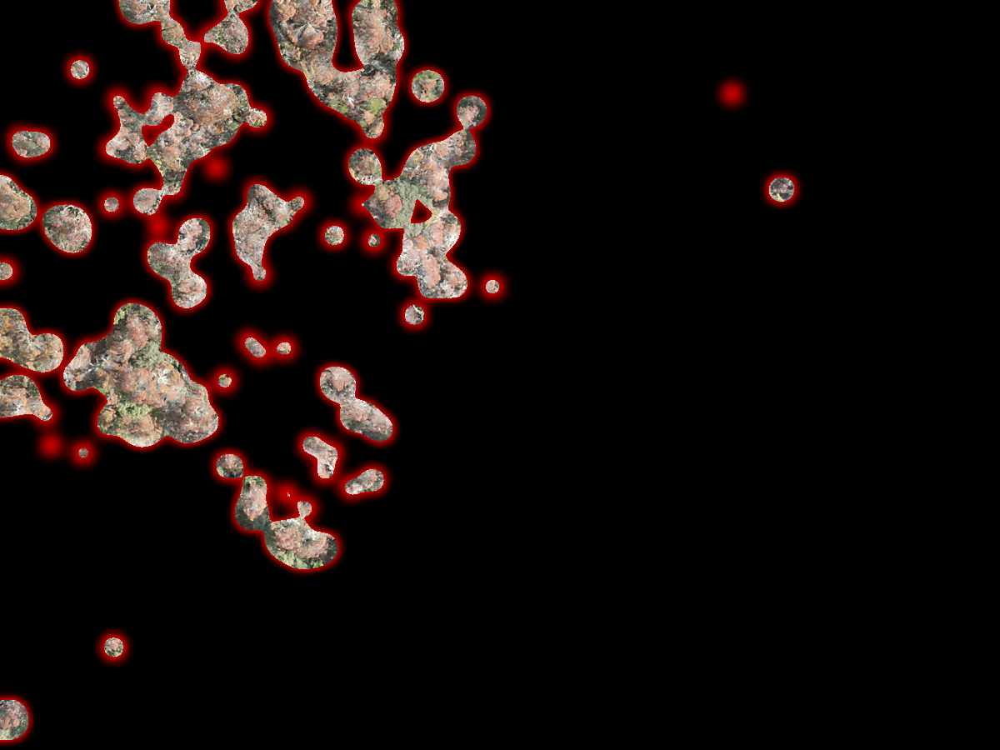

In [97]:
combined = Image.composite(trees, cont, mask)
display(combined)

If we would prefer to see some of the non-infested area, we could use a gray value instead of black for the "no" pixels.

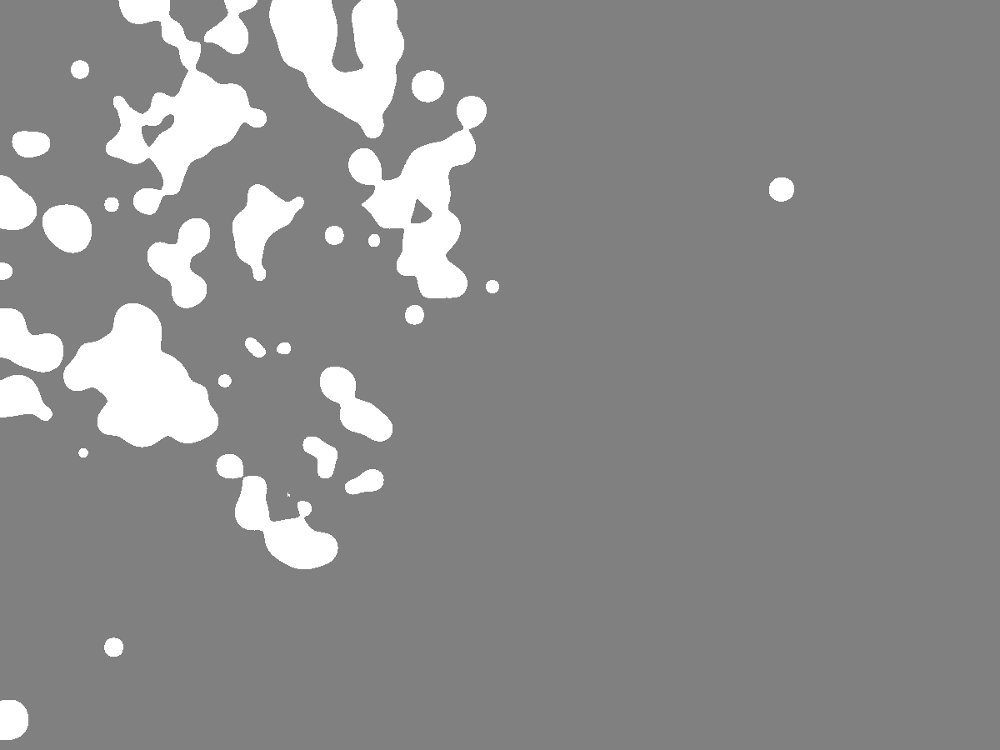

In [120]:
semitransparent = mask.copy()
pixels = semitransparent.load()
tone = 128
for row in range(h):
  for column in range(w):
    if pixels[column, row] == 0: # black
      pixels[column, row] = tone # gray
display(semitransparent)

If we use this mask, the composite image will not be fully blank on the non-affected areas but instead a bit faded out.

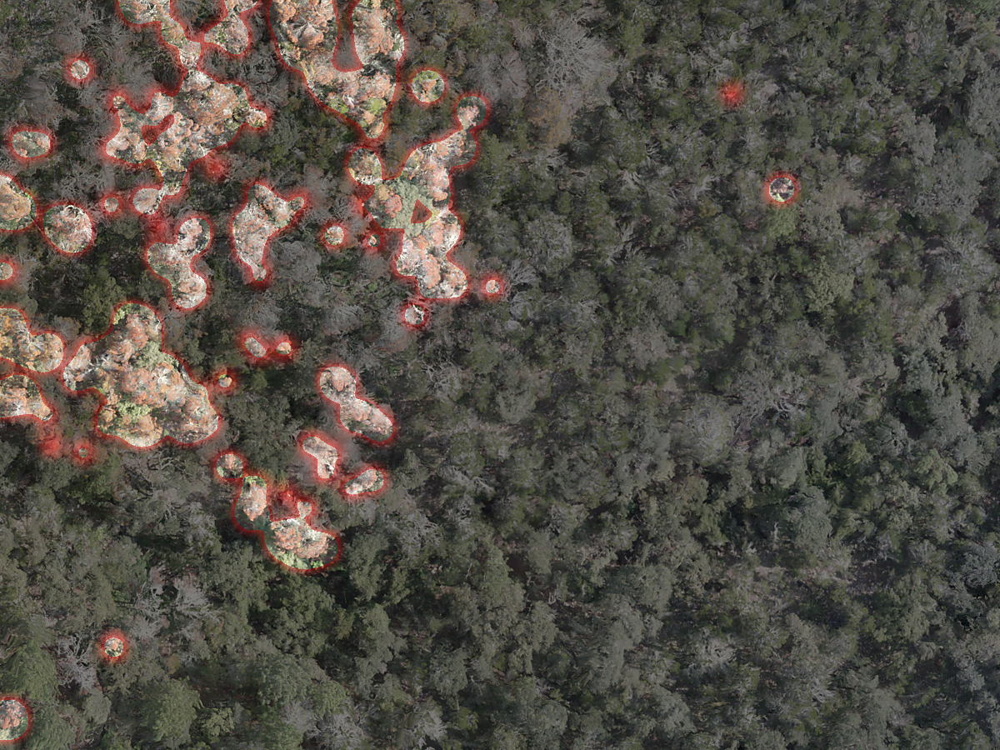

In [121]:
combo2 = Image.composite(trees, cont, semitransparent)
display(combo2)